# DeepDish: a Chicago food violation analysis.

## NB:
### As we use folium (interactive maps) the output are not shown in the notebook on github. Then we invite you to follow this nbviewer link to view all the plots: https://nbviewer.jupyter.org/github/adr1anh/DeepDish/blob/master/chicago_project.ipynb

In [1]:
import math
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import json
import time
from decimal import Decimal
from folium import plugins
import geopy
from geopy.geocoders import Nominatim
from IPython.display import JSON
# from yelpapi import YelpAPI

In [2]:
data=pd.read_csv('data/food-inspections.csv')

In [3]:
data.columns

Index(['Inspection ID', 'DBA Name', 'AKA Name', 'License #', 'Facility Type',
       'Risk', 'Address', 'City', 'State', 'Zip', 'Inspection Date',
       'Inspection Type', 'Results', 'Violations', 'Latitude', 'Longitude',
       'Location', 'Historical Wards 2003-2015', 'Zip Codes',
       'Community Areas', 'Census Tracts', 'Wards'],
      dtype='object')

We keep only the columns of interest.

In [4]:
data=data[['Inspection ID','DBA Name','AKA Name','Facility Type','Risk','Inspection Date','Inspection Type', 'Results', 'Violations','Address', 'Latitude', 'Longitude', 'Zip']]
data.head()

,Inspection ID,DBA Name,AKA Name,Facility Type,Risk,Inspection Date,Inspection Type,Results,Violations,Address,Latitude,Longitude,Zip
0,2345787,"CARNICERIA LEON GUANAJUATO, INC.","CARNICERIA LEON GUANAJUATO, INC.",Grocery Store,Risk 1 (High),2019-11-18T00:00:00.000,Canvass,Fail,"3. MANAGEMENT, FOOD EMPLOYEE AND CONDITIONAL E...",4301-4305 W ARMITAGE AVE,41.916960,-87.733945,60639.0
1,2345790,AMSTAR FUEL & MINI MART,AMSTAR FUEL & MINI MART,Grocery Store,Risk 2 (Medium),2019-11-18T00:00:00.000,Canvass,Pass,"55. PHYSICAL FACILITIES INSTALLED, MAINTAINED ...",3759 W CHICAGO AVE,41.895304,-87.721129,60651.0
2,2345766,ROJO GUSANO,ROJO GUSANO,Restaurant,Risk 1 (High),2019-11-18T00:00:00.000,Canvass,Fail,"3. MANAGEMENT, FOOD EMPLOYEE AND CONDITIONAL E...",3830 W LAWRENCE AVE,41.968390,-87.724448,60625.0
3,2345702,LAKESIDE FOOD WINE SPIRITS LLC,LAKESIDE FOOD WINE SPIRITS LLC,Grocery Store,Risk 3 (Low),2019-11-15T00:00:00.000,License Re-Inspection,Pass w/ Conditions,5. PROCEDURES FOR RESPONDING TO VOMITING AND D...,2601 N HALSTED ST,41.929210,-87.648746,60614.0
4,2345678,"NEW KNOWLEDGE LEARNING CENTER, INC.","NEW KNOWLEDGE LEARNING CENTER, INC.",Children's Services Facility,Risk 1 (High),2019-11-15T00:00:00.000,License,Pass,"53. TOILET FACILITIES: PROPERLY CONSTRUCTED, S...",8440 S KEDZIE AVE,41.739458,-87.702257,60652.0


In [5]:
#We drop the duplicates
print('Number of rows in the original dataset:', len(data))
data=data.drop_duplicates()
print('Number of rows in the dataset without duplicates:', len(data))

Number of rows in the original dataset: 196030
Number of rows in the dataset without duplicates: 195873


We check the proportion of NaN for each column.

In [6]:
# Number of NaN per column.
data.isna().sum()

Inspection ID          0
DBA Name               0
AKA Name            2456
Facility Type       4770
Risk                  71
Inspection Date        0
Inspection Type        1
Results                0
Violations         51974
Address                0
Latitude             689
Longitude            689
Zip                   50
dtype: int64

Text(0.5, 1.0, 'Proportions of missing value')

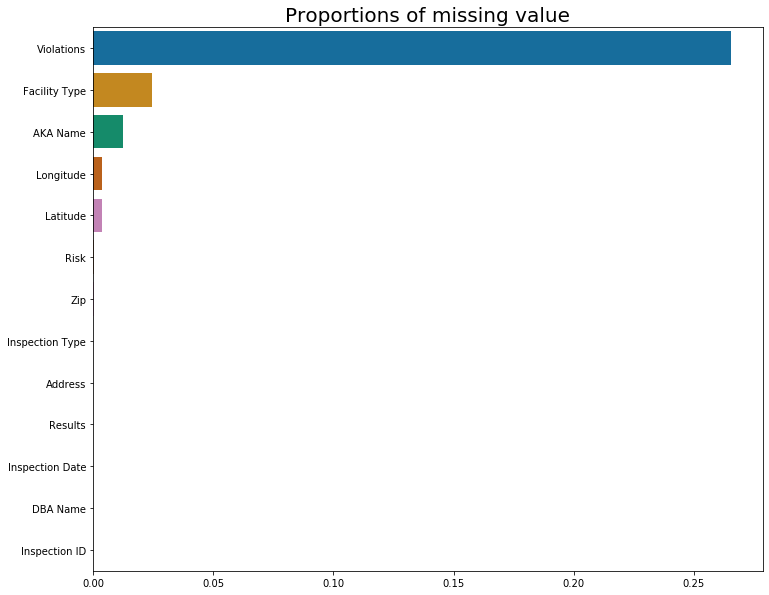

In [7]:
plt.figure(figsize=(12,10))
sns.barplot(x=data.isnull().sum().sort_values(ascending=False)/len(data),y=data.isnull().sum().sort_values(ascending=False).index,palette='colorblind')
plt.title("Proportions of missing value",size=20)

#### We replace the NaN values in AKA Name by the values in the DBA Name.

In [8]:
data['Name']=data['AKA Name'].fillna(data['DBA Name'])

#### We clean the Inspection Date column.

In [9]:
data['Inspection Date']=data['Inspection Date'].apply(lambda x: (x.split('T')[0]).split('-'))
# Create 3 new columns that contains respectively the year, the month and the day of each inspection.
data['year']=data['Inspection Date'].apply(lambda x: x[0])
data['month']=data['Inspection Date'].apply(lambda x: x[1])
data['day']=data['Inspection Date'].apply(lambda x: x[2])

#### Risk column: we merge 'All' and 'Risk 1'.

In [10]:
data["Risk"] = data["Risk"].replace(to_replace =["All"], value =["Risk 1 (High)"]) 

As it is an ordinal variable In the section C.1 we convert them to an int value.

#### We clean the Inspection Type column.

In [11]:
# Replace the NaN values by 'no type'.
data['Inspection Type']=data['Inspection Type'].fillna('no type')
# Convert capital letters to lower case.
data['Inspection Type']=data['Inspection Type'].apply(lambda x: x.lower())
# Determine all the inspection types in the dataframe.
inspec=data['Inspection Type'].unique()
inspec_count=data['Inspection Type'].value_counts()
print('Number of Inspection Types: ', len(inspec_count))
print('Number of Inspection Types with less than 10 occurence: ', len(inspec_count[inspec_count<10]))
display(inspec_count.to_frame())


Number of Inspection Types:  97
Number of Inspection Types with less than 10 occurence:  72


,Inspection Type
canvass,103484
license,25909
canvass re-inspection,20593
complaint,18154
license re-inspection,8976
...,...
expansion,1
citf,1
task force night,1
license canceled by owner,1


We see that we have to regroup the inspection types.

In [12]:
def regroup_labels(all_labels,selected_labels,other=False):
    """
    INPUT: -all_labels (list): list of all the labels.
           -selected_labels (list): list of the generic labels we want to merge smaller labels with.
           -other (Boolean): if True convert all the remaining labels into 'other'.
    OUTPUT: -dico (dictionnary): dictionnary that associates labels with a greater generic label.
    
    """
    dico=dict()
    for words in all_labels:
        for label in selected_labels:
            if label in words:
                dico[words]=label
    if other:
        regroup_other(dico,all_labels)
    return dico

def regroup_other(dico,all_labels):
    """
    Convert all the labels that are not in the dictionnary into 'other'
    INPUT: -dico (dictionnary): dictionnary that associates labels with a greater generic label.
           -all_labels (list): list of all the labels.
    """
    for words in all_labels:
        if words not in dico:
            dico[words]='other'

def replace_label(dico,all_labels,words_to_replace,label,other=False):
    """
    Link all the labels that contains certain words with a generic label.
    INPUT: -dico (dictionnary): dictionnary that associates labels with a greater generic label.
           -all_labels (list): list of all the labels.
           -words_to_replace (list): list of words that appears in the label we want to replace.
           -label (string): label that replace all the labels which contains one of the string in words_to_replace.
    """
    for words in all_labels:
        for w in words_to_replace:
            if w in words:
                dico[words]=label

In [13]:
all_labels_inspec=inspec
# All the inspection types label we want to keep.
selected_labels=['tag removal ','consultation', 'out of business','complaint', 'canvass', 'fire', 'license', 'liquor', 'food poisoning', 'consultation']
# Create a dictionnary to merge all the similar types.
dico_inspec=regroup_labels(all_labels_inspec,selected_labels,other=True)
replace_label(dico_inspec,all_labels_inspec,['canvas'],'canvass')
replace_label(dico_inspec,all_labels_inspec,['o.b.','business'],'out of business')
replace_label(dico_inspec,all_labels_inspec,['liqour'],'liquor')
replace_label(dico_inspec,all_labels_inspec,['sick'],'food poisoning')
# Apply this dictionnary to the dataframe.
data['Inspection Type'].replace(dico_inspec).value_counts().to_frame()

,Inspection Type
canvass,124083
license,35523
complaint,32457
other,1139
food poisoning,1043
consultation,689
fire,322
out of business,309
liquor,308


#### Clean Facility type

In [14]:
facility_count=data['Facility Type'].value_counts()
display(facility_count[0:15].to_frame())
print('Number of facility type: ', len(facility_count))
print('Number of facility type with less than 100 occurences: ', len(facility_count[facility_count<100]))

,Facility Type
Restaurant,130581
Grocery Store,24934
School,12103
Children's Services Facility,3084
Bakery,2869
Daycare (2 - 6 Years),2691
Daycare Above and Under 2 Years,2377
Long Term Care,1353
Catering,1192
Mobile Food Dispenser,868


Number of facility type:  488
Number of facility type with less than 100 occurences:  463


In [15]:
# Replace NaN to the string 'no type'.
data['Facility Type']=data['Facility Type'].fillna('no type')
# Convert strings to lower case.
data['Facility Type']=data['Facility Type'].apply(lambda x: x.lower())
facility=data['Facility Type'].unique()
all_labels=facility
# All the labels we want to keep.
selected_labels=['restaurant','care','mobile','store','bakery','school','catering','no type']
# Create a dictionnary to merge the simmilar types.
dico_facility=regroup_labels(all_labels,selected_labels)
replace_label(dico_facility,all_labels,['child','nurs','assist'],'care')
replace_label(dico_facility,all_labels,['diner','tavern','bar','roof','hotel','brewery'],'restaurant')
replace_label(dico_facility,all_labels,['wholesale','gas','shop','grocery'],'store')
# Create merge all the other types together.
regroup_other(dico_facility,all_labels)
# Replace the Facility Type column in the dataframe by applying the dictionnary.
data['Facility Type'] = data['Facility Type'].replace(dico_facility)
data['Facility Type'].value_counts().to_frame()

,Facility Type
restaurant,131853
store,26424
school,12379
care,10872
no type,4770
other,3727
bakery,2892
mobile,1750
catering,1206


#### We clean the Zip column.

We scrap the missing Zip codes.

In [16]:
locator = Nominatim(user_agent="myGeocoder")
missing = data[data['Zip'].isna()][['Longitude','Latitude']]
lon_lat = []
location = []
zip_missing = []
# We get the longitude and the latitude of the rows with missing Zip.
for k in range(len(missing)):
    lon = missing['Longitude'].iloc[k]
    lat = missing['Latitude'].iloc[k]
    lon_lat.append((lon,lat))
# We get the exact address corresponding to the Latitude/Longitude.
for i in range(len(lon_lat)):
    lon=lon_lat[i][0]
    lat=lon_lat[i][1]
    if not (math.isnan(lon) or math.isnan(lat)):
        # We wait for 1.5 second between each query to avoid the 'Service Timed out error'.
        time.sleep(1.5)
        location.append(locator.reverse('{}, {}'.format(lat,lon)))
    else: 
        location.append(0)
# We extract the Zip code from these addresses.
for j in range(len(location)):
    if not location[j]==0:
        zip_missing.append(location[j][0].split(',')[-2].strip())
    else: zip_missing.append(math.nan)
indexes=missing.index
for (idx, zip_) in zip(indexes, zip_missing):
    data['Zip'].loc[idx] = zip_
display(data[data['Zip'].isna()])

/home/red/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


,Inspection ID,DBA Name,AKA Name,Facility Type,Risk,Inspection Date,Inspection Type,Results,Violations,Address,Latitude,Longitude,Zip,Name,year,month,day
70670,1763245,EAT N RUN CHICKEN AND FISH,EAT N RUN CHICKEN AND FISH,restaurant,Risk 1 (High),"[2016, 04, 19]",license,Not Ready,NaN,,NaN,NaN,NaN,EAT N RUN CHICKEN AND FISH,2016,04,19
125048,1106878,FILIPINO AMERICAN COUNCIL,RIZAL CENTER,restaurant,Risk 1 (High),"[2013, 09, 26]",canvass,Out of Business,NaN,1332 W DRIVING PARK ROAD BSMT,NaN,NaN,NaN,RIZAL CENTER,2013,09,26
191724,60405,CASA CENTRAL LA POSADA,CASA CENTRAL LA POSADA,restaurant,Risk 1 (High),"[2010, 04, 05]",canvass,Pass,37. TOILET ROOM DOORS SELF CLOSING: DRESSING R...,,NaN,NaN,NaN,CASA CENTRAL LA POSADA,2010,04,05


We notice that there are still 3 restaurant with no Zip as we don't have their latitude and longitude, we decide to drop them.

In [17]:
data=data[data['Zip'].notna()]

We look in the ditribution of the Zip codes.

Number of different Zip codes in the dataframe:  130
Number of Zip codes with less or equal than 5 establishments:  61


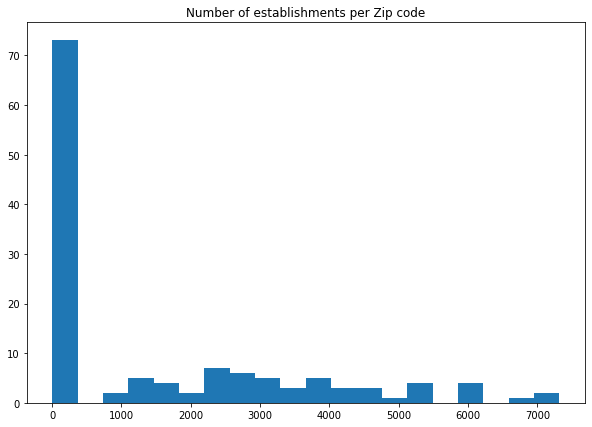

In [18]:
zip_count=data['Zip'].value_counts()
print('Number of different Zip codes in the dataframe: ', len(zip_count))
print('Number of Zip codes with less or equal than 5 establishments: ', len(zip_count[zip_count<=5]))
plt.figure(figsize=(10,7))
plt.hist(zip_count,bins=20)
plt.title('Number of establishments per Zip code')
plt.show()

We can see that roughly half of Zip codes have very few establishments and then it may be misleading to make conclusion on these districts.

#### Violations column

In [19]:
data['Violations'].iloc[1]

'55. PHYSICAL FACILITIES INSTALLED, MAINTAINED & CLEAN - Comments: OBSERVED A FEW DAMAGED AND MISSING CEILING TILES IN THE FRONT SELLING AREA AND IN THE REAR STORAGE AREA. MUST REPLACE AND MAINTAIN. | 56. ADEQUATE VENTILATION & LIGHTING; DESIGNATED AREAS USED - Comments: OBSERVED THE LIGHT SHIELDS INSIDE THE WALK IN COOLER IN POOR REPAIR. MUST REPLACE AND MAINTAIN.'

An element of the Violation column is a large string containing all the violations that noted during the inspection with some comments. We want to create a list of violations for each inspection rather than a full string.

In [20]:
def get_list_violations(text,sep):
    """
    From the full text of the violations, create a list of violations without the comments.
    INPUT: -text (string): string in the violations column.
           -sep (string): string containing the separator between two violations.
    OUTPUT: -list_final (list): list of violations without comments.
    """
    text_low=text.lower()
    list1=text_low.split(sep)
    list_final=[]
    for words in list1:
        text2=words.split(' - ')[0].strip()
        text3='. '.join(text2.split('. ')[1:])
        list_final.append(text3)
    return list_final

def str_to_int(vec):
    """
    Create a dictionnary that associates an int to each violation.
    INPUT: -vec (array): array of strings containing the different types of violations.
    OUTPUT: -dico (dictionnary): dictionnary that associates for each violation an int.
    """
    k=1
    dico=dict()
    for words in vec:
        dico[words]=k
        k+=1
    return dico

def replace_list(vec,dico):
    """
    Replace each array of string to an array int.
    INPUT: -vec (array): array containing the strings we want to convert into int.
           -dico (dictionnary): dictionnary that associates for each string an int.
    OUTPUT: -new_vec (array): array of int corresponding to the input strings.
    """
    new_vec=[]
    for words in vec:
        if words in dico:
            new_vec.append(dico[words])
        else:
            new_vec.append(0)
    return new_vec
    

In [21]:
# We replace all the NaN by an empty string.
data['Violations']=data['Violations'].fillna('')
# We create a list of violations for each inspection.
data['processed Violations']=data['Violations'].apply(lambda x: get_list_violations(x,'|'))
# We enlist all the different violations.
violations=data.explode('processed Violations')['processed Violations'].unique()
# We create the dictionnary associating a violation to an int for better visualization.
dico_violations=str_to_int(violations)
data['Violations int']=data['processed Violations'].apply(lambda x: replace_list(x,dico_violations))

Let's consider only the dataset that contains non NA values for Longitude or Latitude.

We remove the rows with no Latitude and Longitude or Risk for the moment. If we have time, we will try to webscrap Longitude and Latitude by using the Adress column.

In [22]:
data_removed = data[-data[["Latitude","Longitude","Risk"]].isnull().any(axis = 1)]

In [24]:
data_removed.to_pickle('data/nb_data')

# B. Exploratory Data Analysis

### NB:
#### As we use folium (interactive maps) the output are not shown in the notebook on github. Then we invite you to follow this nbviewer link to view all the plots: https://nbviewer.jupyter.org/github/adr1anh/DeepDish/blob/master/chicago_project.ipynb

In this section, we visualize the cleaned data. We make plots centered around variables such as the risk level or the inspections as well as a heatmap to visualize the data geographically.

## B.1 Inspections overview

Here we make 4 plots. The first is a count of the number of inspections by year. The second is a count of the number of inspections by month, using data from all the years. The third plot shows the mean number of inspections depending on the establishment risk level and the fourth is a plot of the count of inspections over the years.

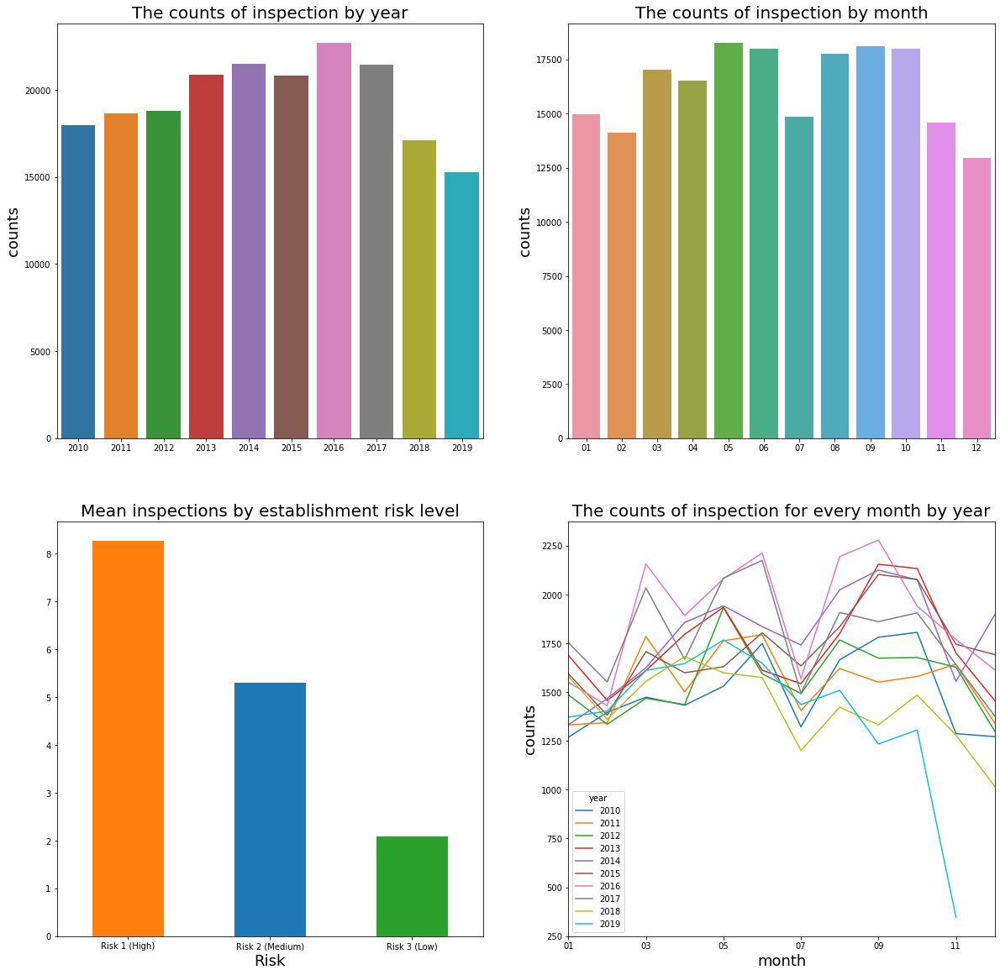

In [23]:
fig,ax=plt.subplots(2,2,figsize=(20,20))
x=data_removed.year.value_counts().index
y=data_removed.year.value_counts()
#Plot 1
sns.barplot(x=x,y=y,ax=ax[0,0])
ax[0,0].set_title("The counts of inspection by year",size=20)
ax[0,0].set_ylabel('counts',size=18)
ax[0,0].set_xlabel('')

x=data_removed.month.value_counts().index
y=data_removed.month.value_counts()
#Plot 2
sns.barplot(x=x,y=y,ax=ax[0,1])
ax[0,1].set_title("The counts of inspection by month",size=20)
ax[0,1].set_ylabel('counts',size=18)
ax[0,1].set_xlabel('')

colors = ['C1','C0','C2']
#Plot 3
mean_inspections = data_removed.groupby(['Risk', 'DBA Name','Latitude','Longitude'])['Inspection ID'].agg('count').unstack('Risk').mean()
mean_inspections.plot(kind='bar', color = colors, ax = ax[1,0])
ax[1,0].set_title("Mean inspections by establishment risk level",size=20)
ax[1,0].tick_params(axis='x',labelrotation=360)
ax[1,0].set_xlabel('Risk', size= 18)

#Plot 4
data_removed.groupby(['year','month'])['Inspection ID'].agg('count').unstack('year').plot(ax=ax[1,1])
ax[1,1].set_title("The counts of inspection for every month by year",size=20)
ax[1,1].set_ylabel('counts',size=18)
ax[1,1].set_xlabel('month',size=18)
plt.show()


The first graph shows a spike in the number of inspections around the year 2016. The second and fourth plots indicate a drop in the inspection rate for the month of July. This drop can be the consequences of workers being on holiday break during the summer.

The third plot indicates that establishments which have had a high risk rating are more likely to be inspected again than those with a lower risk rating. This results is sensible as we expect the inspection authorities to re-investigate an establishment which has a high risk. 

## B.2 Risk overview

Looking at a quick study of the risk we have the following plots. For the first plot the data is grouped by establishment, so as not to count muptiple occurences of the same establishment.

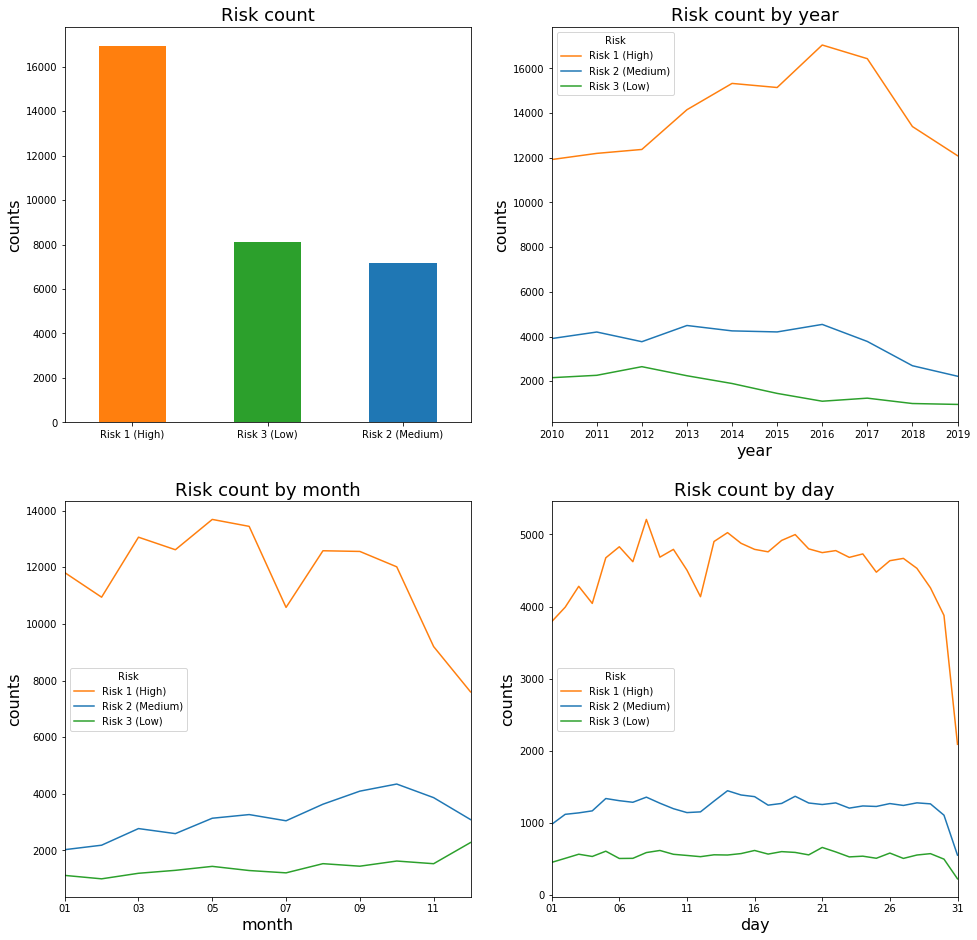

In [23]:
colors = ['C1','C0','C2']
fig,ax=plt.subplots(2,2,figsize=(16,16))
risk_count = data_removed.groupby(['DBA Name','Latitude','Longitude','Risk'])['Inspection ID'].count().to_frame().reset_index()['Risk'].value_counts()
#Plot 1
risk_count.plot(kind = 'bar', color= ['C1','C2','C0'], ax = ax[0,0])
ax[0,0].tick_params(axis='x',labelrotation=360)
ax[0,0].set_title("Risk count",size=18)
ax[0,0].set_ylabel('counts',size=16)

#Plot 2
data_removed.groupby(['year','Risk'])['Inspection ID'].agg('count').unstack('Risk').plot(ax = ax[0,1], color = colors)
ax[0,1].set_title("Risk count by year",size=18)
ax[0,1].set_ylabel('counts',size=16)
ax[0,1].set_xlabel('year',size=16)

#Plot 3
data_removed.groupby(['month','Risk'])['Inspection ID'].agg('count').unstack('Risk').plot(ax = ax[1,0], color = colors)
ax[1,0].set_title("Risk count by month",size=18)
ax[1,0].set_ylabel('counts',size=16)
ax[1,0].set_xlabel('month',size=16)

#Plot 4
data_removed.groupby(['day','Risk'])['Inspection ID'].agg('count').unstack('Risk').plot(ax = ax[1,1], color = colors)
ax[1,1].set_title("Risk count by day",size=18)
ax[1,1].set_ylabel('counts',size=16)
ax[1,1].set_xlabel('day',size=16)

plt.show()

The first plot shows that the vast majority of establishments are considered as high risk while the risk that is less given is Medium Risk.

The second plot shows that the spike of inspections around the year 2016 (described in the previous sub-section) majorly resulted in the count of high risk establishments. The last two plots do not give new insights on the data.

## B.3 Heatmap of the establishments

In [24]:
def generateBaseMap(default_location=[data_removed["Latitude"][0],data_removed["Longitude"][0]],default_zoom_start=10):
    """Create a new folium map"""
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [25]:
#Create a data Frame containing each unique restaurant
name_data = data_removed.groupby(["AKA Name","Latitude","Longitude","year"])
#Count the number of inspections by restaurant
name_count = name_data["DBA Name"].count()
name_map = pd.DataFrame(name_count)
name_map = name_map.rename(columns={"DBA Name": "Count"})
name_map = name_map.reset_index()
name_map.head()

,AKA Name,Latitude,Longitude,year,Count
0,"#1 CHINA EXPRESS , LTD",41.816834,-87.631346,2010,1
1,"#1 CHINA EXPRESS , LTD",41.816834,-87.631346,2012,1
2,#1 CHOP SUEY,41.735578,-87.670781,2010,3
3,#1 CHOP SUEY,41.735578,-87.670781,2011,1
4,#1 CHOP SUEY,41.735578,-87.670781,2013,2


In [26]:
from folium.plugins import HeatMap
base_map = generateBaseMap()
HeatMap(data=data_removed[["Latitude","Longitude"]].groupby(["Latitude","Longitude"]).sum().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(base_map)
base_map.save("Heatmap.html")

The saved map found on github(https://github.com/adr1anh/DeepDish/blob/master/Heatmap.html), gives us the exact location of each establishment plotted on the Chicago interactive map. This give us a first insight on the distribution of the establishments in the city. 

# C. Risk Analysis

Here we look more into the risk following two approaches: first we split the city by zip code areas, then we take a look a the data with respect to each risk level.

## C.1 Risk by Zip Code

In [48]:
#We transform this with numerical values as follows
data_removed["Risk_score"] = data_removed["Risk"].replace(to_replace =["Risk 3 (Low)", "Risk 2 (Medium)", "Risk 1 (High)"],  
                            value =[1,2,3]) 
data_removed.Risk_score = data_removed.Risk_score.astype(float)
data_removed["Risk_score"].value_counts()

C:\Users\elala\Anaconda3\envs\ada\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


3.0    140079
2.0     38063
1.0     16973
Name: Risk_score, dtype: int64

In [28]:
#Groupby ZIPS
zip_data = data_removed.groupby("Zip")
# Count number of failed exams
failed = data_removed[data_removed['Results'] == 'Fail'].groupby('Zip')["Results"].count()
failed_per = ((failed/zip_data.Results.count())*100)
# Look for most frequent facility 
fac = zip_data["Facility Type"].describe()
#High risk restaurant 
high_risk = data_removed.loc[data_removed['Risk_score'] == 3]
high_per = ((high_risk["Zip"].value_counts()/data_removed["Zip"].value_counts())*100)
#Low risk restaurant 
low_risk = data_removed.loc[data_removed['Risk_score'] == 1]
low_per = ((low_risk["Zip"].value_counts()/data_removed["Zip"].value_counts())*100)
#Add all features I can think of
mean_risk = zip_data.Risk_score.mean()
value_count = data_removed["Zip"].value_counts()
risk_map = pd.DataFrame(mean_risk)
risk_map["Count"] = value_count
risk_map["Fail"] = failed
risk_map["Percentage of Failed Exams"] = failed_per
risk_map["Percentage High Risk"] = high_per
risk_map["Percentage Low Risk"] = low_per
risk_map["Top Facility"] = fac.top.values
risk_map = risk_map.reset_index()
risk_map["Zip"] = risk_map["Zip"].astype(int)
risk_map = risk_map.fillna(0)
risk_map["Percentage High Risk"] = risk_map["Percentage High Risk"].astype(int)
risk_map["Percentage Low Risk"] = risk_map["Percentage Low Risk"].astype(int)
risk_map["Percentage of Failed Exams"] = risk_map["Percentage of Failed Exams"].astype(int)
risk_map.to_csv("Risk_study.csv")

As we can see the Zip codes defined above should not be considered for explanatory data analysis as they are clear outliers. Hence from the 109 Zips from the beggining we here work only with 60 of those which are mostly composed of restaurants.

We now use Folium to have nice plots with the value of our table defined above.

In [29]:
# load GeoJSON
with open('data/Boundaries - ZIP Codes.geojson', 'r') as jsonFile:
    data_ = json.load(jsonFile)
tmp = data_

# remove ZIP codes not in our dataset
geozips = []
A=[]
for i in range(len(tmp['features'])):
    A.append(int((tmp['features'][i]['properties']['zip'])))
    if A[i] in (risk_map["Zip"].unique()):
        tmp['features'][i]['properties']['zip'] = int((tmp['features'][i]['properties']['zip']))
        geozips.append(tmp['features'][i])
        
# creating new JSON object
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips

# save JSON object as updated-file
open("updated-file.json", "w").write(
    json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': '))
)

5939874

We have created a JSON file containing all information needed for our ZIP code that are given in our data and that can be found also in Boundaries - ZIP Codes.geojson. We get a dataset with 61 entries, better to find one with more ZIP.

In [30]:
def create_map(table, zips, mapped_feature, add_text = ''):
    # reading of the updated GeoJSON file
    geo = r'updated-file.json'
    # initiating a Folium map with LA's longitude and latitude
    coord = [data_removed["Latitude"][0],data_removed["Longitude"][0]]
    m = folium.Map(location = coord, tiles='cartodbpositron',zoom_start = 10)
    # creating a choropleth map
    m.choropleth(
        geo_data = geo,
        fill_opacity = 0.7,
        line_opacity = 0.2,
        data = table,
        # refers to which key within the GeoJSON to map the ZIP code to
        key_on = 'feature.properties.zip',
        # first element contains location information, second element contains feature of interest
        columns = [zips, mapped_feature],
        fill_color = 'BuPu',
        legend_name = (' ').join(mapped_feature.split('_')).title() + ' Number of facilites ' + add_text + ' Across Chigaco'
    )
    folium.LayerControl().add_to(m)
    # save map with filename based on the feature of interest
    m.save(outfile = mapped_feature + '_map.html')
    return(m)

In [31]:
# We can thus create maps with the given features
create_map(risk_map, 'Zip', 'Risk_score', 'of Facilities')

C:\Users\elala\Anaconda3\envs\ada\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [32]:
create_map(risk_map, 'Zip', 'Count', 'of Facilities')

In [33]:
create_map(risk_map, 'Zip', 'Percentage of Failed Exams', 'of Facilities')

In [34]:
create_map(risk_map, 'Zip', "Percentage High Risk", 'of Facilities')

In [35]:
create_map(risk_map, 'Zip', "Percentage Low Risk", 'of Facilities')

We have now the following results:

In the count map found in the github (https://github.com/adr1anh/DeepDish/blob/master/Count_map.html), we can see that the majority of district have between 1200 and 3500 facilities. We can see that the district with the most facilities are all next to each other and centerd near uptown Chicago. We will now look more in detail which area are given the highest risk and which one actually fails more inspections.

In the map showing the mean risk in each Zip codes area found in the github (https://github.com/adr1anh/DeepDish/blob/master/Risk_score_map.html), we can see that the mean risk is pretty evenly distributed and high around a score of 2.5. This seems not such a good idea to plot the means and we will it the next plots study rather the percentage distribution. 

In the Percentage of High Risk establishment map found in the github (https://github.com/adr1anh/DeepDish/blob/master/Percentage%20High%20Risk_map.html), we can see that the vast majority of districts have between 70-80% of High Risk facilities, we can see that the districts with fewer facilities and further from the upper district of Chicago are also the one with a low percentage of high risk given facilities. Hence we can deduce that it is considered, the residential district have few riskier facilities but less options to eat.

In the Percentage of Low Risk establishment map found in the github (https://github.com/adr1anh/DeepDish/blob/master/Percentage%20Low%20Risk_map.html), we can see that there very few low risk facilities and they are spread evenly across district.

In the Percentage of failed tests Exams map found in the github (https://github.com/adr1anh/DeepDish/blob/master/Percentage%20of%20Failed%20Exams_map.html), we might have expected that the district with the highest count of restaurant who also have a percentage of high risk are not the ones with the highest percentage of failed inspections. The ones with the highest percentage of violation are around 30% and situated in the lower district of chicago, which are more residential but poorer districts.

In [36]:
def coloriage(zip_):
    if risk_map.loc[risk_map['Zip'] == zip_, 'Top Facility'].values[0]=="Restaurant":
        return '#0000ff'
    else:
        return '#ff0000'
    

In [37]:
# We want to look at the map where he have the most frequent facility type
state_geo_path = r"updated-file.json"
geo_json_data = json.load(open(state_geo_path))
results_map = folium.Map([data_removed["Latitude"][0],data_removed["Longitude"][0]],tiles='cartodbpositron', zoom_start=10)
folium.GeoJson(
    geo_json_data,
    style_function=lambda features: {
        'fillColor': coloriage(features["properties"]["zip"]),
        'color' : 'black',
        'weight' : 3,
        'dashArray' : '5, 5'
        }
    ).add_to(results_map)
#Since only one district has more schools than restaurant we do not plot the map as result aren't very intersting

## C.2 Deeper look for different risks

In [38]:
# We split the dataset by risk level
data_risk1 = data_removed[data_removed['Risk'] == 'Risk 1 (High)' ]
data_risk2 = data_removed[data_removed['Risk'] == 'Risk 2 (Medium)' ]
data_risk3 = data_removed[data_removed['Risk'] == 'Risk 3 (Low)' ]


### C.2.1 High risk

Below is an example code of the folium plugin we mainly wanted to use. It allows use to plot heatmaps on the map of Chicago with a slider for the time (in years). However we could not get the map to work, it only showed the plain Chicago map with no widgets for time control nor any points plotted.

This issue is probably from the package updates as we seem to have the exact same problem as the issue raised on these posts:

    https://github.com/python-visualization/folium/issues/1231

    https://github.com/python-visualization/folium/issues/1232

In [39]:
# df = data_risk1[['Latitude','Longitude','year']].groupby('year')['Latitude','Longitude'].agg(lambda x: list(x))
# to_plot = [[[row['Latitude'][k],row['Longitude'][k]] for k in range(len(row['Latitude'])) ] for index, row in df.iterrows() ]
# m= folium.Map(location= [41.6,-87.5],tiles='Stamen Toner', zoom_start=10)
# hm = plugins.HeatMapWithTime(
#     to_plot,
#     auto_play=True,
#     max_opacity=0.5,
#     display_index = True,
#     overlay=True
    
# )
# hm.add_to(m)
# m

#name_data = data_removed.groupby(["AKA Name","Latitude","Longitude","year"])
#name_count = name_data["DBA Name"].count()
#name_map = pd.DataFrame(name_count)
#name_map = name_map.rename(columns={"DBA Name": "Count"})
#name_map = name_map.reset_index()
#name_map.head()

#year_list = []
#for year in data_removed.year.sort_values().unique():
#    year_list.append(name_map.loc[name_map.year == year, ["Latitude","Longitude","Count"]])

#base_map = generateBaseMap(default_zoom_start=11)
#pluginsHeatMapWithTime(year_list, radius=5, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'}, min_opacity=0.5, max_opacity=0.8, use_local_extrema=True).add_to(base_map)
#base_map

Below we plot a heatmap for the establishment that have received a high risk rating. The data plotted here is grouped by establishment so that there are no duplicate points. This map gives some insight as to the geographical location of high risk establishments. 

In [40]:
#Functions for plotting.
def create_folium_map(data_, save_name =''):
    data = data_.groupby(['Latitude','Longitude','DBA Name'])['Inspection ID'].count().to_frame().reset_index()
    coord = [data['Latitude'].mean(), data['Longitude'].mean()]
    m = folium.Map(location=coord, tiles = 'Stamen Toner', zoom_start=10)
    to_plot = data[['Latitude', 'Longitude']].as_matrix()
    m.add_child(plugins.HeatMap(to_plot, radius=15))
    m.save(save_name + '.html')
    return m

def heatmap_plot(data_, color_ = 0):
    data = data_.groupby(['Latitude','Longitude','DBA Name'])['Inspection ID'].count().to_frame().reset_index()
    ax = sns.jointplot("Latitude", "Longitude", data=data, kind="kde", space=0, color= colors[color_], height=7)
    ax.fig.suptitle("Risk 1 (High)")
    plt.show()

Here we create a folium map, saved under the name 'high_risk_map.html'.

In [41]:
create_folium_map(data_risk1, save_name='high_risk_map')

C:\Users\elala\Anaconda3\envs\ada\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


Below is a non-interactive plot of the map above which allows to get a broader insight of the point distribution.

(As we saw that the HeatMapWithTime folium plug-in we explored alternative plots, one of which is the plot shown below however due to time constraints, we could not suceed yet in adding the chicago map as a background picture)

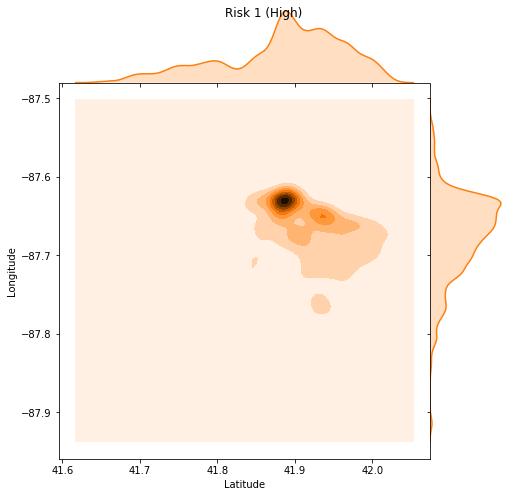

In [42]:
heatmap_plot(data_risk1)

### Medium Risk

Here the same treatement as above is applied but on the medium risk establishments this time.

In [43]:
create_folium_map(data_risk2, save_name='medium_risk_map')

C:\Users\elala\Anaconda3\envs\ada\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


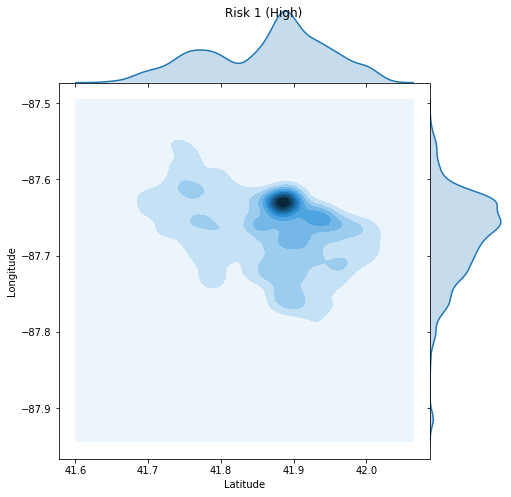

In [44]:
heatmap_plot(data_risk2, color_= 1)

### Low Risk

Here the same treatement as above is applied but on the low risk establishments this time.

In [45]:
create_folium_map(data_risk3, save_name='low_risk_map')

C:\Users\elala\Anaconda3\envs\ada\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


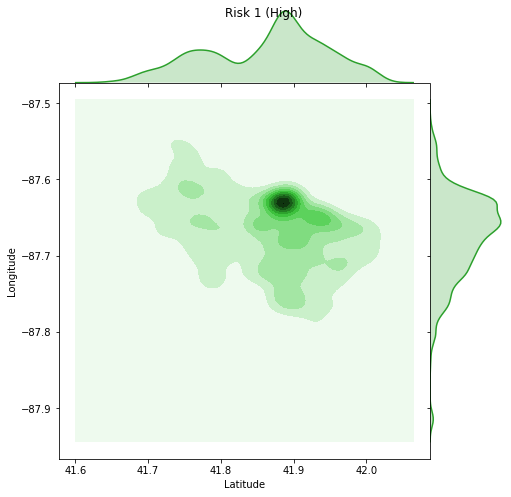

In [46]:
heatmap_plot(data_risk2, color_= 2)

## Violation types

http://dev.cityofchicago.org/open%20data/data%20portal/2018/06/29/food-violations-changes.html

In [264]:
data_removed["Risk_score"] = data_removed["Risk"].replace(to_replace =["Risk 3 (Low)", "Risk 2 (Medium)", "Risk 1 (High)"],  
                            value =[1,2,3]) 
data_removed.Risk_score = data_removed.Risk_score.astype(float)

/home/red/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/red/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [247]:
data_removed_pre2018 = data_removed
data_removed_pre2018 = data_removed_pre2018.astype({'year' : int, 'month' : int, 'day' : int})
sub_2018 = data_removed_pre2018['year'] <= 2017
sub_07_2018 = (data_removed_pre2018['year'] == 2018) & (data_removed_pre2018['month'].isin(['01','02','03','04','05','06']))
data_removed_pre2018 = data_removed_pre2018[sub_2018 | sub_07_2018].reset_index()


In [248]:
def get_violation_numbers(text,sep = '|'):
    """
    From the full text of the violations, create a list of violations without the comments.
    INPUT: text (str): Raw 'Violation' column entry 
    OUTPUT: result (list): list of integers corresponding to violations
    """
    result=[]
    
    if len(text) == 0 :
        return result
    
    text_split= text.split(sep)
    code = text_split[0].split(sep = '.')[0]
    result.append(int(code))
    
    for string in text_split[1:]:
        code = string.split(sep = '.')[0].strip()
        result.append(int(code))   
    return result

In [249]:
data_removed_pre2018['Violation codes']=data_removed_pre2018['Violations'].apply(lambda x: get_violation_numbers(x))

Make a new column called 'Violation risk' with 3 if 'Violation codes' contains a critical violation (1-14), 2 if it contains a serious violation (15-29), 0 if there is no violation code and 1 otherwise.

In [250]:
def get_violation_risk(violation_codes):
    if not set(range(1,15)).isdisjoint(violation_codes):
        return 3
    elif not set(range(15,30)).isdisjoint(violation_codes):
        return 2
    elif violation_codes == []:
        return 0
    else:
        return 1
data_removed_pre2018['Violation risk'] = data_removed_pre2018['Violation codes'].apply(lambda x: get_violation_risk(x))

In [260]:
data_removed_pre2018['Violation risk'].value_counts()

1    79987
2    23441
3    22503
Name: Violation risk, dtype: int64

In [252]:
data_removed_pre2018 = data_removed_pre2018[data_removed_pre2018['Violation risk'] != 0]


In [261]:
data_removed_pre2018 = data_removed_pre2018[(data_removed_pre2018.Results.isin(['Pass', 'Pass w/ Conditions', 'Fail']))] # == 'Pass') | (data_removed_pre2018.Results == 'Pass w/ Conditions') | (data_removed_pre2018.Results == 'Fail')]

data_removed_pre2018['Results binary'] = data_removed_pre2018['Results'].apply(lambda x: 2 if x == 'Pass' else 1 if x == 'Pass w/ Conditions' else 0 )

/home/red/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [262]:
data_removed_pre2018['Results'].value_counts()

Pass                  78707
Fail                  30472
Pass w/ Conditions    16296
Name: Results, dtype: int64

In [263]:
data_removed_pre2018[['Results binary','Violation risk']].corr()

,Results binary,Violation risk
Results binary,1.000000,-0.814248
Violation risk,-0.814248,1.000000


# D. Yelp scrapping

#### Preprocess the data

We only consider the columns which we use to match with Yelp. By removing duplicates, we get an approximative list of all unique businesses. 

In [92]:
establishments = data[['DBA Name', 'AKA Name', 'Address', 'City', 'State']].copy().drop_duplicates().reset_index()
# All Addresses exist, but we may need to examine the cities and state to complete
establishments.isnull().any()

index       False
DBA Name    False
AKA Name     True
Address     False
City         True
State        True
dtype: bool

In [93]:
# Add two columns to relate to Yelp data
establishments['id'] = None

# The matches column will be positive if we have already queried the API for this row
establishments['matches'] = -1

# We set the value to -1 if some of the data is missing. This will allow us to more carefully get the data.
establishments.loc[establishments['City'].isnull(), 'matches'] = -2
establishments.loc[establishments['City'].isnull(), 'matches'] = -2

In [97]:
establishments.nunique()

index       32373
DBA Name    27476
AKA Name    26210
Address     18035
City           71
State           4
id              0
matches         2
dtype: int64

## Yelp Database

Connect to the Yelp API but keep the key in local environment and away from TAs wanting to use my account.

In [2]:
import os
from yelpapi import YelpAPI

YELP_API_KEY = os.environ['YELP_API_KEY']
YELP_CLIENT_ID = os.environ['YELP_CLIENT_ID']
client = YelpAPI(YELP_API_KEY)

#### Read already acquired data

In [3]:
# The yelp_df is a selection of columns of the original df, containing only location information
# We then drop all duplicates and reset the index in order to more easily cross reference with the new data
# We also include a id col corresponding to the yelp id, and a count of how many results returned
yelp_df = pd.read_pickle('yelp/yelp.pkl')

# Contains the scrapped data from yelp
scrapped = pd.read_pickle('yelp/scrapped.pkl')

# Contains remaining data such as reviews, review count, price, and food categories
business = pd.read_pickle('yelp/business.pkl')

# For each business, we get 3 reviews with the start of the text and a rating 
reviews = pd.read_pickle('yelp/reviews.pkl')

### Functions to get data from Yelp

#### Match establishments to Yelp and get ID along with address information

In [4]:
"""
Apply transformation to a business query which will fit the format of our scrapping dataframe.
"""
def business_match_to_df_row(business_):
    business = business_.copy()
    business.update(business.pop('coordinates'))
    business.update(business.pop('location'))
    business.pop('phone')
    business.pop('display_phone')
    business.pop('country')
    if str(business['address2']) == '' or not business['address2']:
        del business['address2']
    if str(business['address3']) == '' or not business['address3']:
        business.pop('address3', None)
    return business

In [152]:
def match_rows_to_yelp(min_range, max_range, yelp_df, scrapped):
    for i in range(min_range,max_range):
        # Get the i-th row of the data frame
        row = yelp_df.iloc[i]
        
        # Special case when our search terms contain NaN
        if row['matches'] == -2:
            continue
            
        # We haven't requested the data yet and no NaN im the request
        if row['matches'] == -1:
            # Some rows have only DBA / AKA
            row_name = row['DBA Name'] if row[['AKA Name']].isnull().values.any() else row['AKA Name']
            
            query = client.business_match_query(name=row_name,
                                                city=row['City'],
                                                state=row['State'],
                                                country='US',
                                                address1=row['Address'])
            
            # We note how many matches we got and only take the first one
            yelp_df.loc[yelp_df.index[i], 'matches'] = len(query['businesses'])
            
            if len(query['businesses']) == 1:
                yelp_df.loc[yelp_df.index[i], 'id'] = query['businesses'][0]['id']
                scrapped = scrapped.append(pd.DataFrame([business_match_to_df_row(query['businesses'][0])]))
            continue
              
        # We have more matches and need to examine more closely which one to insert
        if row['matches'] == 2:
            continue
                
match_rows_to_yelp(12000,13663,yelp_df,scrapped)

#### Get more information for each business

In [108]:
def get_business_details(min_range, max_range, scrapped, business):
    assert(min_range <= max_range and 0 <= min_range and max_range<len(scrapped.index))
    
    # Get all other information from business
    wanted_business = ['id','is_closed','review_count','categories','rating','price','transactions']
    for i in range(min_range,max_range):
        row = scrapped.iloc[i]
        if not business['id'].isin([row['id']]).any():
            query = client.business_query(id=row['id'])
            result = dict((k, query[k]) for k in wanted_business if k in query)
            business = business.append([result])
                
get_business_details(0,10,scrapped,business)

#### Get reviews

In [111]:
def get_reviews(min_range, max_range, scrapped, reviews):
    assert(min_range <= max_range and 0 <= min_range and max_range<len(scrapped.index))
    
    wanted_reviews = ['id','text','rating','time_created']
    for i in range(min_range,max_range):
        row = scrapped.iloc[i]
        if not reviews['id'].isin([row['id']]).any():
            query = client.reviews_query(id=row['id'])
            for review in query['reviews']:
                result = dict((k, review[k]) for k in wanted_reviews if k in review)
                result.update({'business_id':row['id']})
                reviews = reviews.append([result])
get_reviews(0, 10, scrapped, reviews)

## Various lines to combine the three data frames

In [104]:
# Compare the original data with scraped and combine with more business details
yelp_df[yelp_df['id'].notnull()].merge(scrapped,on='id').merge(business,on='id')

,index,DBA Name,AKA Name,Address,City,State,id,matches,address1,address2,...,longitude,name,state,zip_code,is_closed,review_count,categories,rating,price,transactions
0,5,CRAZY BIRD,CRAZY BIRD,1160 W GRAND AVE,CHICAGO,IL,7xiYs3CWFbs9lnqor7iRpQ,1,1160 W Grand Ave,NaN,...,-87.656985,Crazy Bird,IL,60642,False,75,"[{'alias': 'chicken_wings', 'title': 'Chicken ...",4.5,$,"[pickup, delivery]"
1,6,THE REDHEAD PIANO BAR,THE REDHEAD PIANO BAR,16-18 W ONTARIO ST,CHICAGO,IL,KPblL_UbpgEwUbZEUscTvA,1,16 W Ontario St,NaN,...,-87.628740,Redhead Piano Bar,IL,60654,False,529,"[{'alias': 'musicvenues', 'title': 'Music Venu...",3.0,$$,[]
2,7,HAISOUS,CA PHE DA,1800-1802 S CARPENTER ST,CHICAGO,IL,GkW4K_g-wtNCHuF0w8LMYA,1,1800 1/2 S Carpenter St,NaN,...,-87.653500,Ca Phe Da Vietnamese Cafe,IL,60608,False,144,"[{'alias': 'vietnamese', 'title': 'Vietnamese'...",4.0,$$,"[pickup, delivery]"
3,8,HARMONY RESTAURANT,HARMONY RESTAURANT,6525 W ARCHER AVE,CHICAGO,IL,yz-3hfOJYKRnPRBOFPpHqQ,1,6525 W Archer Ave,NaN,...,-87.785297,Harmony Restaurant,IL,60638,False,129,"[{'alias': 'chinese', 'title': 'Chinese'}, {'a...",3.0,$$,"[pickup, delivery]"
4,10,HIMALAYAN SHERPA KITCHEN,HIMALAYAN SHERPA KITCHEN,2701 W LAWRENCE AVE,CHICAGO,IL,2D4YeUTn2GGtrcLoHSpvJQ,1,2701 W Lawrence Ave,NaN,...,-87.696393,Himalayan Sherpa Kitchen,IL,60625,False,23,"[{'alias': 'indpak', 'title': 'Indian'}, {'ali...",4.5,NaN,"[delivery, pickup]"
5,11,7 ELEVEN #35750H,7 ELEVEN,1658 N MILWAUKEE AVE,CHICAGO,IL,Q-0hZSru1U4xSXoM6MdjtA,1,1658 N Milwaukee,NaN,...,-87.679586,7-Eleven,IL,60647,False,5,"[{'alias': 'convenience', 'title': 'Convenienc...",3.0,$,[]
6,11,7 ELEVEN #35750H,7 ELEVEN,1658 N MILWAUKEE AVE,CHICAGO,IL,Q-0hZSru1U4xSXoM6MdjtA,1,1658 N Milwaukee,NaN,...,-87.679586,7-Eleven,IL,60647,False,5,"[{'alias': 'convenience', 'title': 'Convenienc...",3.0,$,[]
7,13,7-ELEVEN #35750A,7-ELEVEN,1658 N MILWAUKEE AVE,CHICAGO,IL,Q-0hZSru1U4xSXoM6MdjtA,1,1658 N Milwaukee,NaN,...,-87.679586,7-Eleven,IL,60647,False,5,"[{'alias': 'convenience', 'title': 'Convenienc...",3.0,$,[]
8,13,7-ELEVEN #35750A,7-ELEVEN,1658 N MILWAUKEE AVE,CHICAGO,IL,Q-0hZSru1U4xSXoM6MdjtA,1,1658 N Milwaukee,NaN,...,-87.679586,7-Eleven,IL,60647,False,5,"[{'alias': 'convenience', 'title': 'Convenienc...",3.0,$,[]
9,12,WALGREENS #10771,WALGREENS #10771,6460 W FULLERTON AVE,CHICAGO,IL,Qk7K6Y1S6rmduUNch70bsA,1,6460 W Fullerton Ave,NaN,...,-87.788128,Walgreens,IL,60707,True,4,"[{'alias': 'drugstores', 'title': 'Drugstores'...",2.5,$$,[]


In [112]:
yelp_df[yelp_df['id'].notnull()].merge(scrapped,on='id')

In [125]:
yelp_df

,index,DBA Name,AKA Name,Address,City,State,id,matches
0,0,SERENDIPITY CHILDCARE,SERENDIPITY CHILDCARE,1300 W 99TH ST,CHICAGO,IL,sPBHUHyv7fwgcPs4jy5LMg,1
1,1,YOLK TEST KITCHEN,YOLK TEST KITCHEN,1767 N MILWAUKEE AVE,CHICAGO,IL,heSNmi80snMFaD2aqux8EA,1
2,2,LAS ASADAS MEXICAN GRILL,LAS ASADAS MEXICAN GRILL,3834 W 47TH ST,CHICAGO,IL,btDjEovu7jypI9vCRe7q8A,1
3,3,LA PALAPITA,LA PALAPITA,3834 W 47TH ST,CHICAGO,IL,None,0
4,4,47TH ST CANTINA,47TH ST CANTINA,4311 W 47TH ST,CHICAGO,IL,None,0
...,...,...,...,...,...,...,...,...
32369,194730,"SURF & TURF WHERE SEAFOOD & STEAK MEET, INC.","SURF & TURF WHERE SEAFOOD & STEAK MEET, INC.",13205 S MUSKEGON AVE,CHICAGO,IL,None,-1
32370,194746,SAFAH FOOD & LIQUOR INC,SAFAH FOOD & LIQUOR INC,7105 S RACINE AVE,CHICAGO,IL,None,-1
32371,194758,MAKIA FOOD,MAKIA FOOD,2458 S CALIFORNIA AVE,CHICAGO,IL,None,-1
32372,194763,DUNKIN DONUTS,NaN,970 W PERSHING RD,CHICAGO,IL,None,-1


In [126]:
scrapped

,address1,address2,address3,alias,city,display_address,id,latitude,longitude,name,state,zip_code
0,1160 W Grand Ave,NaN,NaN,crazy-bird-chicago-2,Chicago,"[1160 W Grand Ave, Chicago, IL 60642]",7xiYs3CWFbs9lnqor7iRpQ,41.891326,-87.656985,Crazy Bird,IL,60642
0,16 W Ontario St,NaN,NaN,the-redhead-piano-bar-chicago,Chicago,"[16 W Ontario St, Chicago, IL 60654]",KPblL_UbpgEwUbZEUscTvA,41.893530,-87.628740,Redhead Piano Bar,IL,60654
0,1800 1/2 S Carpenter St,NaN,NaN,ca-phe-da-vietnamese-cafe-chicago,Chicago,"[1800 1/2 S Carpenter St, Chicago, IL 60608]",GkW4K_g-wtNCHuF0w8LMYA,41.857870,-87.653500,Ca Phe Da Vietnamese Cafe,IL,60608
0,6525 W Archer Ave,NaN,NaN,harmony-restaurant-chicago,Chicago,"[6525 W Archer Ave, Chicago, IL 60638]",yz-3hfOJYKRnPRBOFPpHqQ,41.792210,-87.785297,Harmony Restaurant,IL,60638
0,2701 W Lawrence Ave,NaN,NaN,himalayan-sherpa-kitchen-chicago,Chicago,"[2701 W Lawrence Ave, Chicago, IL 60625]",2D4YeUTn2GGtrcLoHSpvJQ,41.968459,-87.696393,Himalayan Sherpa Kitchen,IL,60625
...,...,...,...,...,...,...,...,...,...,...,...,...
0,215 W Jackson Blvd,NaN,NaN,lukes-italian-beef-chicago,Chicago,"[215 W Jackson Blvd, Chicago, IL 60606]",vqCfdZCRH7h6eAB0U7ANGg,41.877969,-87.634405,Luke's Italian Beef,IL,60606
0,1659 W Ogden Ave,NaN,NaN,the-ogden-chicago-4,Chicago,"[1659 W Ogden Ave, Chicago, IL 60612]",ecj6b2CGcThT_1tQSxnStA,41.879758,-87.667800,The Ogden,IL,60612
0,3002 N Sheffield Ave,NaN,NaN,panes-bread-cafe-chicago,Chicago,"[3002 N Sheffield Ave, Chicago, IL 60657]",skpDldmlZlw6e82tpiVyrg,41.936486,-87.654205,Panes Bread Cafe,IL,60657
0,3104 N Central Ave,NaN,NaN,tasty-polish-food-chicago,Chicago,"[3104 N Central Ave, Chicago, IL 60634]",fcn5oDHf_3Ml8_eTgjcbJw,41.937031,-87.766792,Tasty Polish Food,IL,60634


In [127]:
business

,id,is_closed,review_count,categories,rating,price,transactions
0,7xiYs3CWFbs9lnqor7iRpQ,False,75,"[{'alias': 'chicken_wings', 'title': 'Chicken ...",4.5,$,"[pickup, delivery]"
0,KPblL_UbpgEwUbZEUscTvA,False,529,"[{'alias': 'musicvenues', 'title': 'Music Venu...",3.0,$$,[]
0,GkW4K_g-wtNCHuF0w8LMYA,False,144,"[{'alias': 'vietnamese', 'title': 'Vietnamese'...",4.0,$$,"[pickup, delivery]"
0,yz-3hfOJYKRnPRBOFPpHqQ,False,129,"[{'alias': 'chinese', 'title': 'Chinese'}, {'a...",3.0,$$,"[pickup, delivery]"
0,2D4YeUTn2GGtrcLoHSpvJQ,False,23,"[{'alias': 'indpak', 'title': 'Indian'}, {'ali...",4.5,NaN,"[delivery, pickup]"
0,Q-0hZSru1U4xSXoM6MdjtA,False,5,"[{'alias': 'convenience', 'title': 'Convenienc...",3.0,$,[]
0,Qk7K6Y1S6rmduUNch70bsA,True,4,"[{'alias': 'drugstores', 'title': 'Drugstores'...",2.5,$$,[]
0,dv8o6WDhQB9SkQiS0kytrQ,False,2,"[{'alias': 'tradamerican', 'title': 'American ...",3.0,$,[]
0,TZv2SNMJ7jnF1dcre3bLPw,False,4,"[{'alias': 'pizza', 'title': 'Pizza'}]",1.5,$,"[pickup, delivery]"


In [151]:
# Get number of matched businesses

len(yelp_df[yelp_df['matches'] > 0])/len(yelp_df[yelp_df['matches'] >= 0])

0.6773386693346674

In [132]:
reviews

,id,text,rating,time_created,business_id
0,Ybp-1fP53VzilpbwYkYVPA,Outstanding service and a great meal! \nI was ...,5,2019-11-07 18:09:09,7xiYs3CWFbs9lnqor7iRpQ
0,FqrJ2anEaVI05ZYoPPAY2w,"I really enjoyed this place! I split a ""whole ...",4,2019-10-25 09:22:26,7xiYs3CWFbs9lnqor7iRpQ
0,7ZDHGmevUF__oUU3b_O9Zw,Awesome place. We stopped in for a bite and go...,5,2019-08-24 17:28:05,7xiYs3CWFbs9lnqor7iRpQ
0,Ybp-1fP53VzilpbwYkYVPA,Outstanding service and a great meal! \nI was ...,5,2019-11-07 18:09:09,7xiYs3CWFbs9lnqor7iRpQ
0,FqrJ2anEaVI05ZYoPPAY2w,"I really enjoyed this place! I split a ""whole ...",4,2019-10-25 09:22:26,7xiYs3CWFbs9lnqor7iRpQ
0,7ZDHGmevUF__oUU3b_O9Zw,Awesome place. We stopped in for a bite and go...,5,2019-08-24 17:28:05,7xiYs3CWFbs9lnqor7iRpQ
0,Ybp-1fP53VzilpbwYkYVPA,Outstanding service and a great meal! \nI was ...,5,2019-11-07 18:09:09,KPblL_UbpgEwUbZEUscTvA
0,FqrJ2anEaVI05ZYoPPAY2w,"I really enjoyed this place! I split a ""whole ...",4,2019-10-25 09:22:26,KPblL_UbpgEwUbZEUscTvA
0,7ZDHGmevUF__oUU3b_O9Zw,Awesome place. We stopped in for a bite and go...,5,2019-08-24 17:28:05,KPblL_UbpgEwUbZEUscTvA
0,xkBX8B7IvDPYb_pEjyuGpQ,I just have to say Kaleen Dolan is the reason ...,5,2019-10-26 15:58:27,GkW4K_g-wtNCHuF0w8LMYA


## Save the all data

In [150]:
yelp_df.to_pickle('yelp/yelp.pkl')
scrapped.to_pickle('yelp/scrapped.pkl')
business.to_pickle('yelp/business.pkl')
reviews.to_pickle('yelp/reviews.pkl')